# <span style="color:darkblue"> Machine Learning</span>
#### <span style="color:darkred">  Riccardo Beccaria - Febbraio 2022</span>

# <span style="color:green"> Progetto computazionale<span>

In [1]:
from IPython.display import Image
import warnings
warnings.filterwarnings("ignore")

### <span style="color:darkred">  Dataset utilizzato</span>

Il tumore al cervello è considerato una delle malattie più aggressive tra adulti e bambini. Questi tipi di tumori possono essere classificati in diversi modi a seconda della regione in cui crescono. Tra queste classi ci sono: il tumore pituitario, il tumore del glioma e il tumore del meningioma.
La tecnica migliore per rilevare un tumore celebrale è l'Imaging a Risonanza Magnetica (MRI). Tramite queste scansioni possono essere generate una grande quantità di immagini. I radiologi visualizzando queste immagini possono individuare manualmente la presenza e la classe di un eventuale tumore.
I tumori al cervello sono complessi: presentano molte anomalie nella posizione e nella dimensione. Questo rende spesso difficile la completa comprensione del tumore.

Il Dataset da me utilizzato contiene una collezione di immagini ottenute tramite risonanze magnetiche di cervelli sani e di cervelli affetti da uno dei tre tipi di tumore sopra citati. Ciascuna immagine è stata opportunamente etichettata manualmente e organizzata all'interno di cartelle differenziate per classe. È possibile trovare il dataset online al sito:

https://www.kaggle.com/sartajbhuvaji/brain-tumor-classification-mri

Remote source: https://github.com/sartajbhuvaji/brain-tumor-classification-dataset

Alcune caratteristiche delle immagini:

- Le immagini totali del dataset sono 3264 che ho diviso in 2611 immagini per il training e 653 immagini per il testing (80% e 20%).
- La dimensione delle immagini è molto variabile poiché, probabilmente, sono state raccolte da diversi ospedali o poliambulatori. Solitamente le immagini sono state salvate con dimensione 512×512x3 (immagini RGB), ma le dimensioni possono per l'appunto svariare da 225x225x3 fino a 1024x830x3.

A causa di questa seconda osservazione, per uniformare i dati all'interno del mio dataset ho dovuto ridimensionare le immagini attraverso `cv2.resize()`.

### <span style="color:darkred">  Overview dei metodi utilizzati</span>

L'obiettivo del mio progetto è il confronto di alcune tecniche di Machine Learning per la classificazione delle immagini tumorali presenti all'interno del Dataset. I metodi utilizzati sono tre:

1. Una rete neurale convoluzionale (CNN) che riceve in ingresso le immagini del dataset opportunamente ridimensionate ad un'unica dimensione caratteristica.
2. Una rete neurale feed farward (FFNN) che riceve come input le prime componenti principali del dataset ottenute tramite la tecnica della Principant Component Analysis (PCA).
3. Una Random Forest (RF) che ha come input le immagini senza alcun filtro.

La bontà di ciascun modello è valutata non solo per l'accuratezza sul test set e sul training set, ma anche per il tempo di allenamento dell'algoritmo.

### <span style="color:darkred">  Caricamento dei dati</span>

Il caricamento dei dati è avvenuto tramite la libreria `cv2`. Nel caricamento di ciascuna immagine ho utilizzato la flag `cv2.IMREAD_GRAYSCALE` per convertire l'immagine RGB in scala di grigi. La ragione di questa scelta è che nell'immagine il colore non gioca alcun ruolo: passare da tre a un canale per il colore riduce di due terzi la dimensionalità dello spazio degli input. Questo mi consentirà di migliorare le performance dei metodi senza perdere di accuratezza.

Ciascun immagine è stata inserita in una lista di nome inputs, e la classe corrispondente in una seconda lista di nome labels. Ciascuna immagine è stata ridimensionata tramite la funzione `cv2.resize()` per uniformare gli input della rete.

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
from tqdm import tqdm
import os
from sklearn.model_selection import train_test_split



%config InlineBackend.figure_format = 'retina'

np.random.seed(21)

In [3]:
names = ['glioma_tumor','no_tumor','meningioma_tumor','pituitary_tumor']

In [4]:
inputs = []
labels = []
image_size = 100
for i in names:
    folderPath = os.path.join('./data','Training',i)
    for j in tqdm(os.listdir(folderPath)):
        
        img = cv2.imread(os.path.join(folderPath,j), cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img,(image_size, image_size))
        
        if j==0:
            print(type(img))
        inputs.append(img)
        labels.append(i)
        
for i in names:
    folderPath = os.path.join('./data','Testing',i)
    for j in tqdm(os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath,j), cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img,(image_size,image_size))
        
        inputs.append(img)
        labels.append(i)
        
for i in tqdm(range(len(inputs))): 
    inputs[i]=inputs[i].tolist()
inputs = np.array(inputs, dtype=object)
labels = np.array(labels)

100%|█████████████████████████████████████| 3264/3264 [00:01<00:00, 2831.91it/s]


Una volta caricati i dati ho deciso di plottare il numero di uscite di ciascun label all'interno del Dataset. Una distribuzione pressoché uniforme delle diverse classi è necessaria per ridurre il più possibile il bias nella creazione del modello. Effettivamente nel grafico sottostante, è possibile osservare come le tre classi tumorali presentino all'incirca lo stesso numero di dati. Il numero di immagini di cervelli sani è inferiore. Tuttavia, la non grossa discrepanza tra le dimensioni delle quattro classi dovrebbe consentire di ottenere un buon modello per la classificazione del Dataset.

Sotto il grafico, ho mostrato un'immagine per ciascuna classe. Ho fatto questo per consentire una visione della differenza dei tumori presenti all'interno delle immagini, e per mostrare la risoluzione di ciasun dato dopo l'opportuno ridimensionamento.

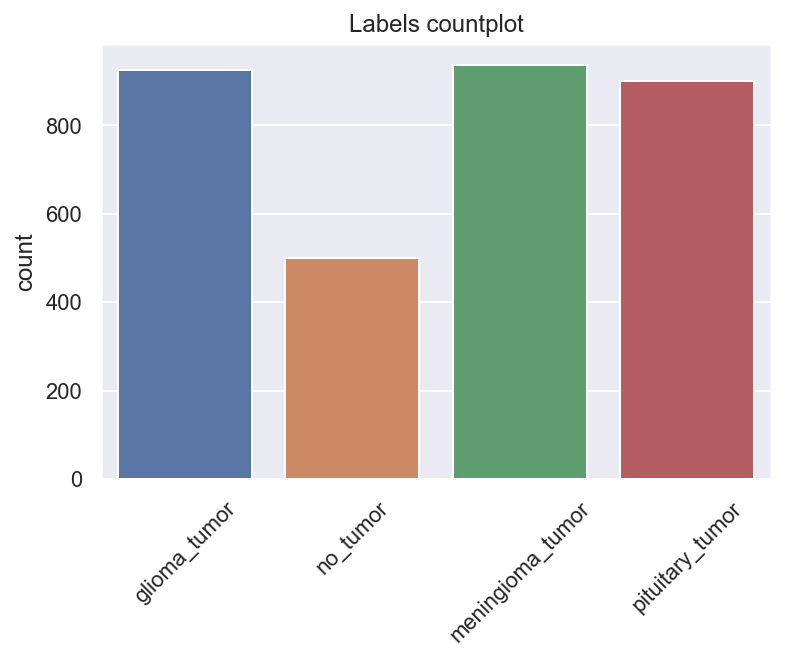

In [5]:
import seaborn as sns

sns.set_theme(style="darkgrid")
sns.countplot(labels)
plt.title("Labels countplot")
plt.xticks(rotation = 45) 
plt.show()

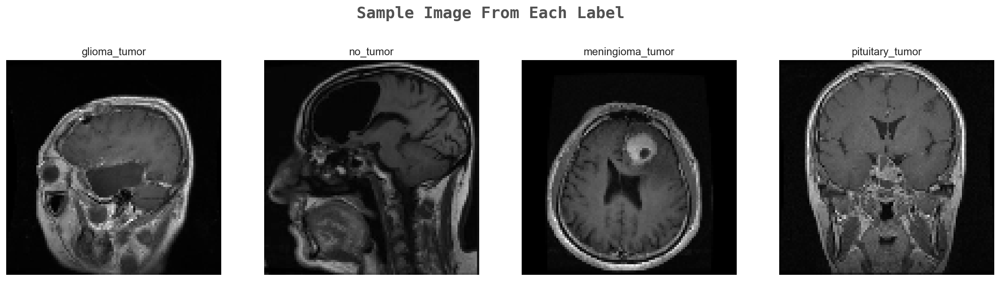

In [6]:
inputs = inputs[:,:,:,np.newaxis]

k=0
fig, ax = plt.subplots(1,4,figsize=(20,20))
fig.text(s='Sample Image From Each Label',size=18,fontweight='bold',
             fontname='monospace',y=0.62,x=0.4,alpha=0.8)
for i in names:
    j=0
    while True :
        if labels[j]==i:
            first_image = np.array(inputs[j], dtype='float')
            pixels = first_image.reshape((image_size, image_size))
            ax[k].imshow(pixels, cmap='gray')
            ax[k].set_title(labels[j])
            ax[k].axis('off')
            k+=1
            break
        j+=1

Prima di procede all'allenamento del primo metodo, è stato necessario convertire le liste in opportuni array affinché questi ultimi possano essere dati in pasto alla rete neurale attravreso la libreria `Keras`. Inoltre ho convertito i dati di output da stringhe a vettori di quattro componenti, dove ciascuna di queste è rappresentativa di una delle quattro classi con cui è diviso il mio dataset.

Da ultimo ho diviso l'intero dataset in una dataset di train e in un dataset di test. Nel dividere questi due dataset ho anche mischiato tutti i dati per evitare di avere dei bias nel modello per come erano stati in precedenza salvate le immagini.

In [7]:
labels_new = []
for i in labels:
    labels_new.append(names.index(i))
labels = labels_new
labels = np.asarray(labels)

from tensorflow.keras.utils import to_categorical
labels = to_categorical(labels)

In [8]:
train_size = 0.8
test_size = 1 - train_size
X_train, X_test, Y_train, Y_test = train_test_split(inputs, labels, train_size=train_size,
                                                    test_size=test_size, shuffle=True)

X_train = np.asarray(X_train).astype('float32')
Y_train = np.asarray(Y_train).astype('float32')
X_test = np.asarray(X_test).astype('float32')
Y_test = np.asarray(Y_test).astype('float32')

### <span style="color:darkred">  CNN - Convolutional Neural Networks</span>

Il concetto chiave di una rete neurale convoluzionale risiede proprio nella capacità di convoluzione. Sfruttando la proprietà di località degli input della Rete, la convoluzione avviene tra pixel localmente vicini per mezzo di un filtro che scorre lungo tutta l'immagine. Sinteticamente si può dire che ogni singola convoluzione è data da:

$$S(m,n)=\sum_{i,j=-q}^qx(m-i,n-j)w(i,j)$$

Dove $w(i,j)$ è proprio il filtro generato dalla rete. Solitamente ogni layer compie più di una convoluzione con diversi filtri in modo da ottenere più immagini convoluzionate da una singola immagine di input: si veda l'immagine. I layer quindi di una CNN sono:
1. *Convolutional layer*: usato per la trasformazione di un volume di input in un volume di features date da convoluzioni di quello iniziale.
2. *Activation layer*: un layer di attivazione in cui ogni singola feature viene passata all'interno di un'attivazione (tanh, Relu, sigmoide...)
3. *Maxpooling layer*: è il layer di riduzione dimensionale in cui, considerata una certa regione di features, si prende una sua media o il valore minimo o il valore massimo o funzioni di queste.

Alla fine di questi layers, le features vengono "appiattite" e passate all'interno di una rete neurale Feed Farward, al termine della quale si hanno i quattro layer di previsione.

<img src="./img/Typical_cnn.png" alt="fishy" class="bg-primary mb-1" width="700px">

Reference: Image from Wikipedia, the free encyclopedia https://en.wikipedia.org/wiki/Convolutional_neural_network

Per quanto riguarda la mia rete neurale convoluzionale ho creato un modello piuttosto profondo per la complessità del Dataset di partenza.

Il valore del learning rate $\eta$ con cui ottimizzare i parametri del modello è stato scelto confrontando l'accuratezza del modello allenato con diversi iperparamentri. Non ho riportato questo studio per brevità del report. Come il valore di $\eta$ anche il valore di $\lambda$ è stato scelto alla stessa maniera. $\lambda$ viene usato come regolarizzatore per i parametri della rete.

Alcune idee con cui ho costruito il modello sono:

- Ho implementato un `Early_Stopping` per arrestare il processo di allenamento qualora il sistema incominciasse a fare overfitting. L'overffiting è quel fenomeno per cui aumenta la funzione di costo sul dataset di test all'aumentare del numero di epoche. Implementando l'Early Stopping si può fornire una minima variazione richiesta e un numero di epoche minimo in cui soddisfare la condizione prima dell'interruzione dell'allenamento. Nel mio caso, ho richiesto una diminuzione della funzione costo di 0.005 nel corso di tre epoche.

- Provando diversi modelli ho potuto constatare  che il modello funziona meglio senza alcun tipo di `Padding`. Il Padding è quel processo in cui si inseriscono delle features nulle attorno al bordo dell'input per non diminuire la dimensione dell'immagine di partenza durante la convoluzione. La mia ipotesi è che in questo caso non è molto utile fare il padding a causa del nero presente al bordo di tutte le immagini del mio dataset.

- All'interno della Feed Farward Neural Network finale ho inserito alcuni layer di `Dropout`. Questi layer sono in grado di azzerare l'input in un dato layer con una certa frequenza da me stabilita. Ho implementato due layer di dropout in modo da evitare che il modello facesse overfitting sul dataset. L'introduzione di questi layer non deve far stupire di possibili casi in cui la funzione costo valutata sul dataset di training risulti maggiore della funzione costo valutata sul dataset di test.

- Come ottimizzatore ho usato `Adam` che ha due particolarità. La prima è quella di compiere un passo in una data direzione all'interno dello spazio dei parametri, in dipendenza del valore del gradiente: il passo sarà tanto maggiore quanto più piccolo il gradiente. La seconda caratteristica è quella di introdurre un termine di momento nella discesa del gradiente.

- Ho allenato la rete dividendo il dataset in `mini-batch` nella speranza di uscire da minimi locali della funzione costo qualora il modello ci capitasse durante il training.

Di seguito il codice per l'implementazione della rete neurale attraverso la libreria keras.

In [9]:
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Sequential      #This allows appending layers to existing models
from tensorflow.keras.layers import Dense           #This allows defining the characteristics of a particular layer
from tensorflow.keras import optimizers             #This allows using whichever optimiser we want (sgd,adam,RMSprop)
from tensorflow.keras import regularizers           #This allows using whichever regularizer we want (l1,l2,l1_l2)
from tensorflow.keras.utils import to_categorical 
import tensorflow as tf
warnings.filterwarnings("ignore")

eta=0.001
lmbd=0.0001

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3, min_delta=0.005)

model = models.Sequential()
model.add(layers.Conv2D(32, (5, 5), activation='tanh', padding="valid", input_shape=(image_size, image_size, 1), kernel_regularizer=regularizers.l2(lmbd)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(lmbd)))
model.add(layers.MaxPooling2D((3, 3)))
model.add(layers.Conv2D(64, (3, 3), activation='tanh', kernel_regularizer=regularizers.l2(lmbd)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='tanh', kernel_regularizer=regularizers.l2(lmbd)))
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='tanh', kernel_regularizer=regularizers.l2(lmbd)))
model.add(layers.Dropout(rate=0.05))
model.add(layers.Dense(128, activation='tanh', kernel_regularizer=regularizers.l2(lmbd)))
model.add(layers.Dropout(rate=0.05))
model.add(layers.Dense(32, activation='tanh', kernel_regularizer=regularizers.l2(lmbd)))
model.add(layers.Dense(4,activation='softmax', kernel_regularizer=regularizers.l2(lmbd)))

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 96, 96, 32)        832       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 46, 46, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 15, 15, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 13, 13, 64)        36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 32)          1

2022-02-19 12:14:20.989719: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [10]:
warnings.filterwarnings("ignore")
Adam = optimizers.Adam(learning_rate=eta)
model.compile(loss='categorical_crossentropy', optimizer=Adam, metrics=['accuracy'])

np.random.seed(21)

history = model.fit(X_train, Y_train, epochs=20, 
                    validation_data=(X_test, Y_test), batch_size=128, callbacks=[callback], verbose=2)




2022-02-19 12:14:21.109592: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)


Epoch 1/20
21/21 - 12s - loss: 1.5109 - accuracy: 0.3232 - val_loss: 1.3889 - val_accuracy: 0.4288
Epoch 2/20
21/21 - 11s - loss: 1.3140 - accuracy: 0.4615 - val_loss: 1.3238 - val_accuracy: 0.4701
Epoch 3/20
21/21 - 11s - loss: 1.2056 - accuracy: 0.5140 - val_loss: 1.1226 - val_accuracy: 0.5069
Epoch 4/20
21/21 - 12s - loss: 1.0689 - accuracy: 0.5661 - val_loss: 0.9563 - val_accuracy: 0.6141
Epoch 5/20
21/21 - 12s - loss: 0.9255 - accuracy: 0.6503 - val_loss: 0.7909 - val_accuracy: 0.7228
Epoch 6/20
21/21 - 11s - loss: 0.7811 - accuracy: 0.7105 - val_loss: 0.7208 - val_accuracy: 0.7550
Epoch 7/20
21/21 - 11s - loss: 0.6786 - accuracy: 0.7648 - val_loss: 0.7257 - val_accuracy: 0.7243
Epoch 8/20
21/21 - 11s - loss: 0.6133 - accuracy: 0.7943 - val_loss: 0.6236 - val_accuracy: 0.7871
Epoch 9/20
21/21 - 11s - loss: 0.5427 - accuracy: 0.8211 - val_loss: 0.7057 - val_accuracy: 0.7611
Epoch 10/20
21/21 - 11s - loss: 0.4911 - accuracy: 0.8430 - val_loss: 0.6221 - val_accuracy: 0.7979
Epoch 11/

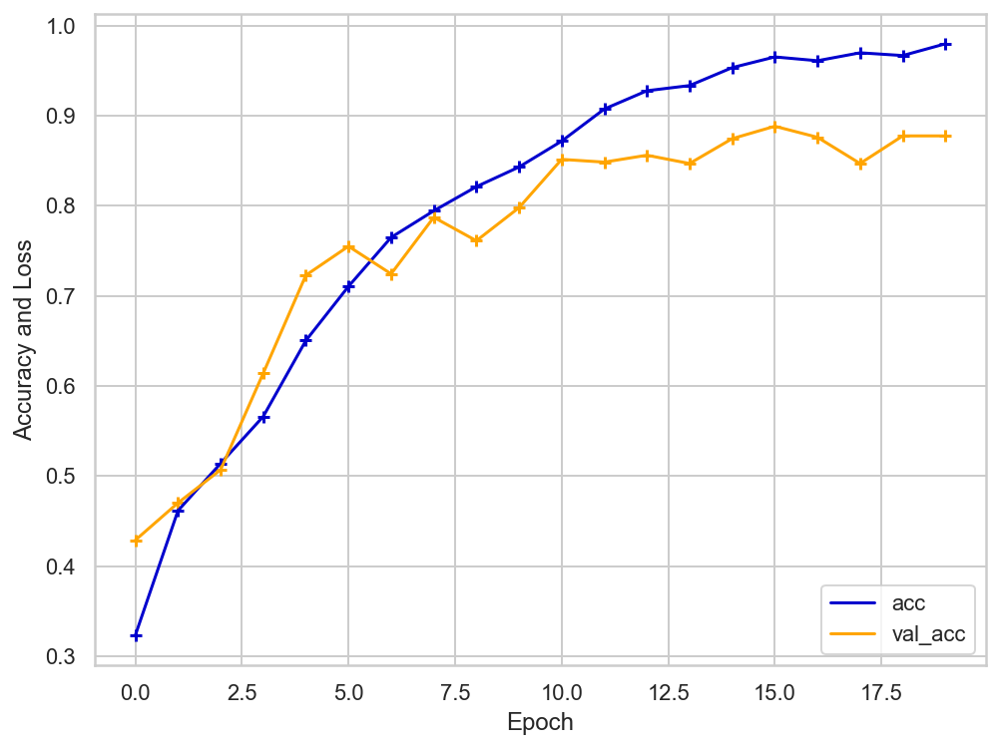

In [11]:
x=np.linspace(0,len(history.history["loss"])-1, num=len(history.history["loss"]))
sns.set_theme(style="whitegrid")

plt.figure(figsize=(8,6))
plt.plot(history.history['accuracy'], label='acc', color='mediumblue')
plt.plot(history.history['val_accuracy'], label = 'val_acc', color='orange')
plt.scatter(x, history.history['accuracy'], marker='+', color='mediumblue')
plt.scatter(x, history.history['val_accuracy'], marker='+', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy and Loss')
plt.grid(True)
plt.legend(loc='lower right')
plt.show()

In [12]:
print("CNN - Best Model: ")
print("Training Accuracy: " + str(format(history.history['accuracy'][-1], '.3f')))
print("Testing Accuracy: " + str(format(history.history['val_accuracy'][-1], '.3f')))

CNN - Best Model: 
Training Accuracy: 0.980
Testing Accuracy: 0.877


I parametri della rete neurale da allenare sono più di 240 mila. Ho riportato nel grafico soprastante l'andamento dell'accuratezza della rete in funzione delle epoche di allenamento. L'accuratezza viene calcolata come la percentuale di immagini classificate correttamente. Questo valore viene misurato ad ogni epoca sia per il training set che per il test set. Dopo appena una ventina di epoche si può osservare che l'accuratezza del training set raggiunge quasi il valore uno, rapresentativo della corretta predizione delle classi di tutte le immagini. Sul training set si riesce a raggiungere un'accuratezza circa del 90%.

La bontà di questo modello non è solo in termini di predizioni ma anche di ottimizzazione computazionale: la rete richiede all'incirca cinque minuti per essere allenata sul mio computer (MacBook Pro - Versione 11.0.1).

Ho riportato nelle celle sottostanti alcune predizioni della mia rete neurale convoluzionale sulle prime dieci immagini del dataset di training e del dataset di test, per avere anche un'impressione grafica della bontà della rete neurale.

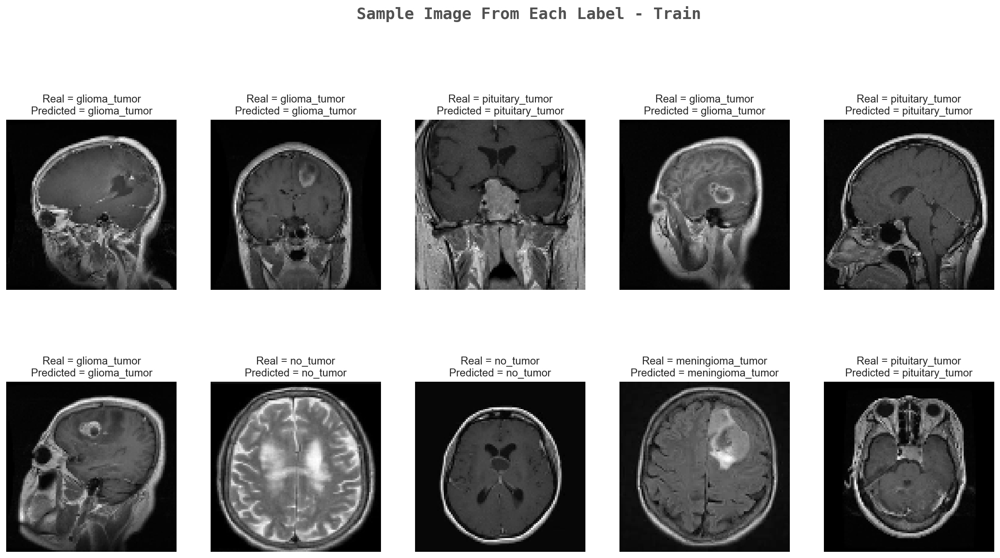

In [13]:
predictions=model.predict(X_train[:10])
results=[]
for i in range(len(predictions)):
    results.append(names[int(np.where(predictions[i]==max(predictions[i]))[0])])
    

k=0
fig, axs = plt.subplots(2,5,figsize=(20,10))
fig.text(s='Sample Image From Each Label - Train',size=18,fontweight='bold',
             fontname='monospace',y=1,x=0.4,alpha=0.8)


for i, ax in enumerate(axs.flat):
    first_image = np.array(X_train[i], dtype='float')
    pixels = first_image.reshape((image_size, image_size))
    ax.imshow(pixels, cmap='gray')
    ax.set_title('Real = '+str(names[int(np.where(Y_train[i] == max(Y_train[i]))[0])])
                           +'\n'+ 'Predicted = '+ str(results[i]))
    ax.axis('off')




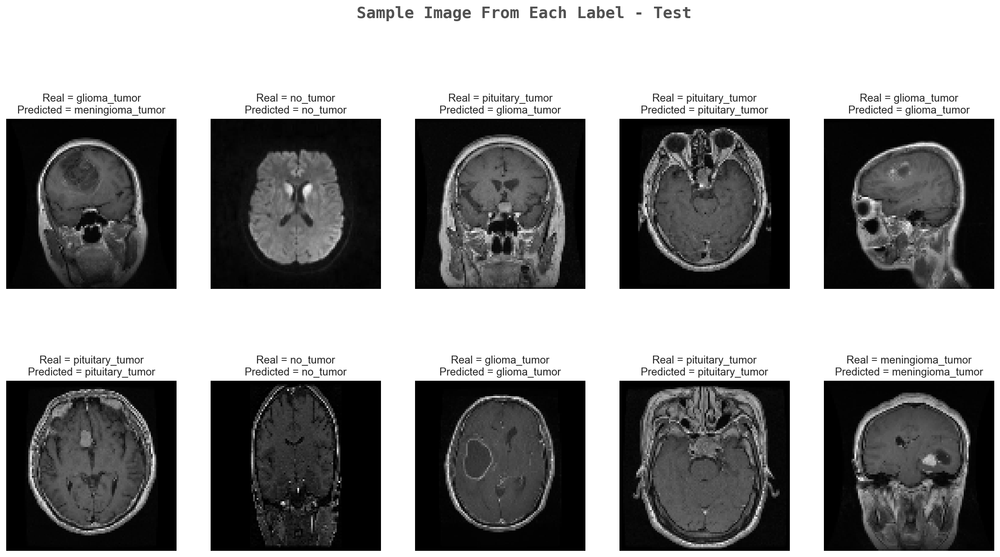

In [14]:
predictions=model.predict(X_test[1:11])
results=[]
for i in range(len(predictions)):
    results.append(names[int(np.where(predictions[i]==max(predictions[i]))[0])])
    

k=0
fig, axs = plt.subplots(2,5,figsize=(20,10))
fig.text(s='Sample Image From Each Label - Test',size=18,fontweight='bold',
             fontname='monospace',y=1,x=0.4,alpha=0.8)

for i, ax in enumerate(axs.flat):
    first_image = np.array(X_test[i+1], dtype='float')
    pixels = first_image.reshape((image_size, image_size))
    ax.imshow(pixels, cmap='gray')
    ax.set_title('Real = '+str(names[int(np.where(Y_test[i+1] == max(Y_test[i+1]))[0])])
                           +'\n'+ 'Predicted = '+ str(results[i]))
    ax.axis('off')

### <span style="color:darkred">  FFNN - Feed Farward Neural Networks & PCA</span>

Osservando le immagini dei tumori celebrali mi sono accorto della grande quantità di pixels neri che circondano i bordi della lastra. Molto probabilmente questi non rientrano tra le features principali per la predizione del modello. Per questo mi sono chiesto se esistesse un modello in grado di classificare correttamente le immagini dopo un'opportuna riduzione dimensionale: la mia idea è stata quindi quella di ridurre dimensionalmente il dataset tramite PCA e di passare a una rete neurale Feed Farward il nuovo dataset ottenuto dalla Principant Component Analysis.

La `PCA` è una tecnica di riduzione dimensionale, per cui uno spazio $\mathbf{R^P}$ viene proiettato su uno spazio p-dimensioanle tramite i primi p autovettori della matrice di correlazione del Dataset $C[x]$. Infatti, i primi p vettori della matrice di correlazione sono quelli in grado di massimizzare la varianza del dataset.

$$X^{PCA}=\bar{X}\tilde{V}, \quad \quad \tilde{V}=(\vec{v}_1, ..., \vec{v}_p) \quad C[x]\vec{v}_j=\sigma^2_j\vec{v}_j$$

Chiaramente i vettori $\{\vec{v}_j\}$ non saranno altro che combinazioni lineari delle mie features iniziali. Il primo problema è stato quello di stimare il numero dei p vettori necessari da utilizzare per ridurre correttamente le dimensioni del dataset. Per trovare questo numero, ho semplicemente trasformato il dataset tramite una PCA che consideri un numero sempre maggiore di componenti principali, fino a trovare un dataset che antitrasformato mi consenta di avere un'immagine simile a quella di partenza. Ho mostrato questo nelle celle sottostanti.

In [15]:
from sklearn.decomposition import PCA

X_train_new=np.reshape(X_train, (len(X_train), image_size*image_size))
X_test_new=np.reshape(X_test, (len(X_test), image_size*image_size))
Y_train_new=np.argmax(Y_train, axis=-1)
Y_test_new=np.argmax(Y_test, axis=-1)

pca_10 = PCA(10)
pca_10.fit(X_train_new)
pca_100 = PCA(100)
pca_100.fit(X_train_new)
pca_500 = PCA(500)
pca_500.fit(X_train_new)
pca_1000 = PCA(1000)
pca_1000.fit(X_train_new)

pcas=[pca_10, pca_100, pca_500, pca_1000]

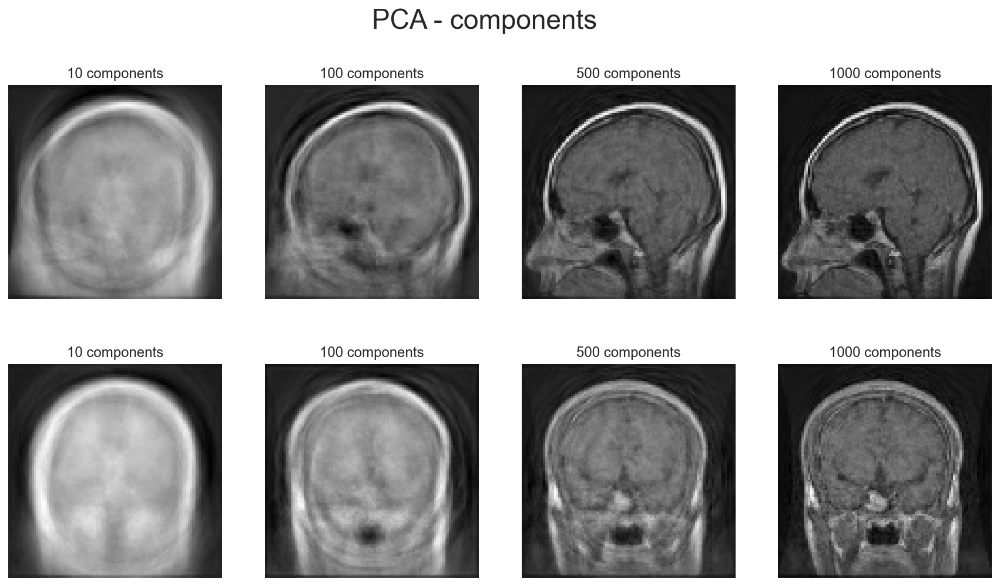

In [16]:
numbers=[10,100,500,1000]

fig, ax =plt.subplots(2,4, figsize=(15,8))
fig.suptitle('PCA - components', fontsize=23)

for i,pca in enumerate(pcas):
    
    Z_train = pca.transform(X_train_new)
    Z_test = pca.transform(X_test_new)
    
    prova=pca.inverse_transform(Z_train[4])
    first_image = np.array(prova, dtype='float')
    pixels = first_image.reshape((image_size, image_size))
    
    prova2=pca.inverse_transform(Z_train[22])
    second_image = np.array(prova2, dtype='float')
    pixels2 = second_image.reshape((image_size, image_size))
    
    ax.flat[i].imshow(pixels, cmap='gray')
    ax.flat[i+4].imshow(pixels2, cmap='gray')
    ax.flat[i+4].axis('off')
    ax.flat[i+4].set_title(str(numbers[i])+' components')
    ax.flat[i].axis('off')
    ax.flat[i].set_title(str(numbers[i])+' components')

Da queste immagini è possibile osservare che sebbene cinquecento componenti sono in grado di generare un'immagine già simile all'immagine di partenza, non risultano ancora definiti alcuni dettagli che potrebbero essere fondamentali per una buona classificazione. Ad esempio nella zona centrale dell'immagine la risoluzione risulta ancora essere piuttosto scarsa e dal momento che questa regione è quella solitamente occupata da tumori pituitari, questi potrebbero non essere correttamente classificati dalla rete. Per questa ragione ho deciso di non utilizzare solamente le prime 500 componenti ma di prendere le prime mille.

Una volta deciso il numero di componenti principali da utilizzare per la riduzione dimensionale ho trasformato il dataset che sarà quindi composto dal solito numero di campionamenti, ma in cui ciascun campionamento vive in uno spazio mille dimensionale: ho ridotto le dimensioni dello spazio di un fattore 10:

$$\mathbf{D}=\{(\vec{x}_i, y_i), \quad  \vec{x}_i\in\mathbf{R}^{1000}, i=1,...,N, \quad y_i=0,1,2,3\}$$

Ho usato questo nuovo dataset per fare una classificazione delle immagini attraverso una rete neurale Feed Farward.

Una `FFNN`-Feed Farward Neural Network è una rete neurale che ha lo scopo di predire un certo valore o una certa classe a partire da alcune features. A differenza di una rete convoluzionale, nelle reti feed farward l'input scorre soltanto in una direzione. In questo modo l'output viene predetto come combinazione lineare di valori intermedi opportunamente pesati e attivati da una certa funzione di attivazione non lineare. Questi "valori intermedi" sono a loro volta ottenuti come combinazioni lineari delle features. Questo è un così detto Hidden Layer. Pertanto si può sintetizzare la rete neurale come:

$$
\begin{cases}
z_j=\sum_i^{m(l)}w^l_{i,j}x_i+b_j \quad\quad \text{se l=1}\\ \\
z_j^l=\sum_i^{m(l)}w^l_{i,j}h_i^{l-1}+b_j \quad\quad \text{se l>1,} \quad \text{con} \quad h_i^{l-1}=f(z_i^{l-1}) \\ \\
\hat{y}_k=a(z_k^L) \quad \quad \text{se l=L}
\end{cases}
$$

Dove $f$ e $a$ sono dette funzioni di attivazione, e $w_{i,j}$, $b_j$ sono i pesi e bias della rete in ciascun layer. Per allenare la rete neurale ho usato la stessa strategia precedentemente presentata nel caso della rete convoluzionale.

- In primo luogo ho cercato la migliore struttura per la mia rete neurale. Ho potuto verificare che la migliore archittettura si ha con `5 Hidden Layers`, in cui il numero di neuroni aumenta nel primo per poi diminuire nei successivi livelli.
- Come nel caso della CNN ho inserito alcuni layer di `Dropout` per cercare di ridurre l'eventuale overfitting. Ho inserito due Layer di Dropout tra i primi due layer perché sono quelli che complessivamente presentano la maggior parte di neuroni all'interno del modello.
- In questo caso ho utilizzato `SGD` come ottimizzatore e implementato un `Early Stopping` per ridurre il più possibile overfitting all'interno del modello. Durante la fase di allenamento ho diviso il dataset in `mini-batch` anche in quest'occasione.

Di seguito, l'implementazione della rete neurale.

In [17]:
Z_train = pca_1000.transform(X_train_new)
Z_test = pca_1000.transform(X_test_new)

mean=Z_train.mean()
std= Z_train.std()

Z_train=(Z_train-mean)/std
Z_test=(Z_test-mean)/std

Z_train.shape

(2611, 1000)

In [18]:
eta=0.001
lmbd=0.0001
n_components=1000

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=6, min_delta=0.005)

model_FFNN = models.Sequential()
model_FFNN.add(layers.Dense(2400, activation='tanh', kernel_regularizer=regularizers.l2(lmbd), input_shape=(n_components,)))
model_FFNN.add(layers.Dropout(rate=0.01))
model_FFNN.add(layers.Dense(1240, activation='sigmoid', kernel_regularizer=regularizers.l2(lmbd)))
model_FFNN.add(layers.Dropout(rate=0.05))
model_FFNN.add(layers.Dense(520, activation='tanh', kernel_regularizer=regularizers.l2(lmbd)))
model_FFNN.add(layers.Dense(124, activation='tanh', kernel_regularizer=regularizers.l2(lmbd)))
model_FFNN.add(layers.Dense(16, activation='tanh', kernel_regularizer=regularizers.l2(lmbd)))
model_FFNN.add(layers.Dense(4,activation='softmax', kernel_regularizer=regularizers.l2(lmbd)))

model_FFNN.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 2400)              2402400   
_________________________________________________________________
dropout_2 (Dropout)          (None, 2400)              0         
_________________________________________________________________
dense_5 (Dense)              (None, 1240)              2977240   
_________________________________________________________________
dropout_3 (Dropout)          (None, 1240)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 520)               645320    
_________________________________________________________________
dense_7 (Dense)              (None, 124)               64604     
_________________________________________________________________
dense_8 (Dense)              (None, 16)               

In [19]:
print("[INFO] training network...")
sgd = optimizers.SGD(learning_rate=eta)
model_FFNN.compile(loss="categorical_crossentropy", optimizer=sgd, metrics=["accuracy"])


np.random.seed(21)

history = model_FFNN.fit(Z_train, Y_train, epochs=100, 
                    validation_data=(Z_test, Y_test), batch_size=128, callbacks=[callback], verbose=2)

[INFO] training network...
Epoch 1/100
21/21 - 1s - loss: 1.7798 - accuracy: 0.2972 - val_loss: 1.7583 - val_accuracy: 0.3645
Epoch 2/100
21/21 - 1s - loss: 1.7264 - accuracy: 0.3554 - val_loss: 1.7212 - val_accuracy: 0.4119
Epoch 3/100
21/21 - 1s - loss: 1.6939 - accuracy: 0.4182 - val_loss: 1.6925 - val_accuracy: 0.4349
Epoch 4/100
21/21 - 1s - loss: 1.6714 - accuracy: 0.4565 - val_loss: 1.6729 - val_accuracy: 0.4487
Epoch 5/100
21/21 - 1s - loss: 1.6442 - accuracy: 0.4853 - val_loss: 1.6466 - val_accuracy: 0.4686
Epoch 6/100
21/21 - 1s - loss: 1.6260 - accuracy: 0.5013 - val_loss: 1.6259 - val_accuracy: 0.5084
Epoch 7/100
21/21 - 1s - loss: 1.6105 - accuracy: 0.4998 - val_loss: 1.6098 - val_accuracy: 0.4977
Epoch 8/100
21/21 - 1s - loss: 1.5937 - accuracy: 0.5190 - val_loss: 1.5969 - val_accuracy: 0.4992
Epoch 9/100
21/21 - 1s - loss: 1.5775 - accuracy: 0.5393 - val_loss: 1.5806 - val_accuracy: 0.5222
Epoch 10/100
21/21 - 1s - loss: 1.5636 - accuracy: 0.5389 - val_loss: 1.5696 - val

Epoch 83/100
21/21 - 1s - loss: 1.2575 - accuracy: 0.6810 - val_loss: 1.2998 - val_accuracy: 0.6570
Epoch 84/100
21/21 - 1s - loss: 1.2512 - accuracy: 0.6825 - val_loss: 1.2979 - val_accuracy: 0.6600
Epoch 85/100
21/21 - 1s - loss: 1.2548 - accuracy: 0.6806 - val_loss: 1.2983 - val_accuracy: 0.6478
Epoch 86/100
21/21 - 1s - loss: 1.2494 - accuracy: 0.6817 - val_loss: 1.2975 - val_accuracy: 0.6401
Epoch 87/100
21/21 - 1s - loss: 1.2463 - accuracy: 0.6844 - val_loss: 1.2954 - val_accuracy: 0.6432
Epoch 88/100
21/21 - 1s - loss: 1.2466 - accuracy: 0.6856 - val_loss: 1.2872 - val_accuracy: 0.6539
Epoch 89/100
21/21 - 1s - loss: 1.2375 - accuracy: 0.6879 - val_loss: 1.2857 - val_accuracy: 0.6662
Epoch 90/100
21/21 - 1s - loss: 1.2369 - accuracy: 0.6917 - val_loss: 1.2854 - val_accuracy: 0.6570
Epoch 91/100
21/21 - 1s - loss: 1.2308 - accuracy: 0.6967 - val_loss: 1.2845 - val_accuracy: 0.6462
Epoch 92/100
21/21 - 1s - loss: 1.2340 - accuracy: 0.6879 - val_loss: 1.2801 - val_accuracy: 0.6600


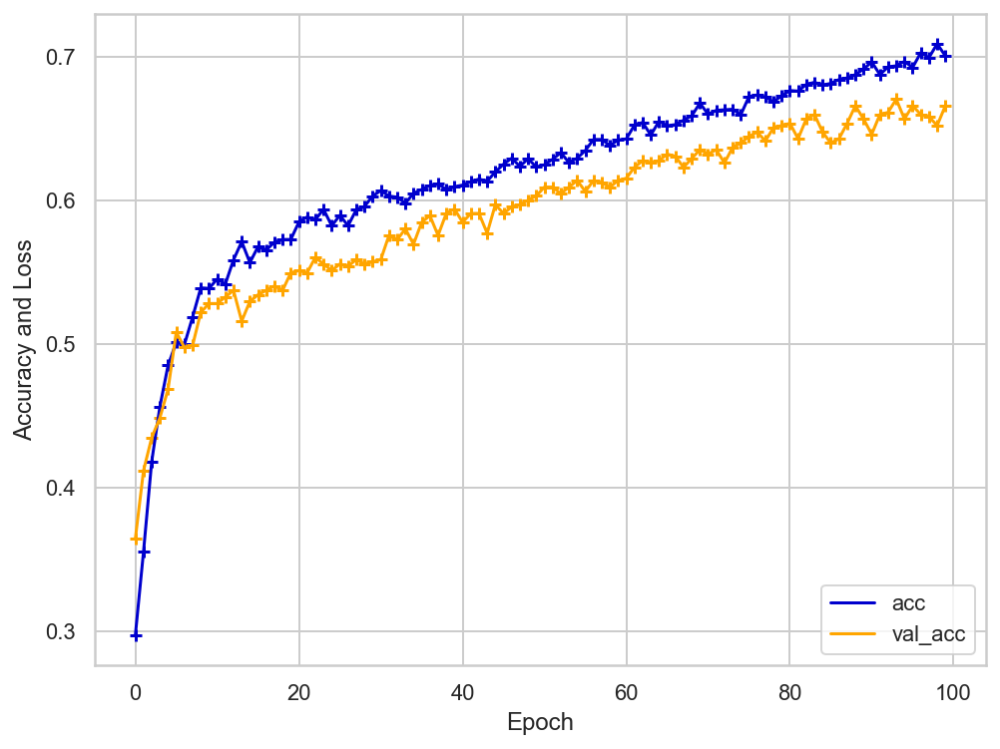

In [20]:
x=np.linspace(0,len(history.history["loss"])-1, num=len(history.history["loss"]))
sns.set_theme(style="whitegrid")

plt.figure(figsize=(8,6))
plt.plot(history.history['accuracy'], color='mediumblue', label='acc')
plt.plot(history.history['val_accuracy'],  color='orange', label = 'val_acc')
plt.scatter(x, history.history['accuracy'], marker='+', color='mediumblue')
plt.scatter(x, history.history['val_accuracy'], marker='+', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy and Loss')

plt.grid(True)
plt.legend(loc='lower right')
plt.show()

In [21]:
print("CNN - Best Model: ")
print("Training Accuracy: " + str(format(history.history['accuracy'][-1], '.3f')))
print("Testing Accuracy: " + str(format(history.history['val_accuracy'][-1], '.3f')))

CNN - Best Model: 
Training Accuracy: 0.701
Testing Accuracy: 0.666


In questo caso i parametri da dover allenare sono più di sei milioni: un numero di gran lunga superiore al numero dei parametri nella rete neurale convoluzionale. Questo è dovuto dal fatto che il numero di neuroni in questa rete è di molto più grande del numero di neuroni nella FFNN al termine della CNN. Il modello risente di questo fatto nel numero di epoche necessarie per allenare il dataset: se nella rete convoluzionale ne bastavano una ventina, in questo caso ho bisogno di almeno un centinaio di epoche per ottenere una buona predizione.

Nonostante questa accortezza, benché il modello sembra stare imparando a classificare alcuni tumori, non riesce a raggiungere il livello di accuratezza raggiunto con la rete neurale convoluzionale. Raggiunge infatti un'accuratezza del 70% sul dataset di training.

Come si vede dal grafico, aumentando il numero di epoche si raggiungerebbero probabilmente migliori performance. Ho deciso di arrestarmi a 100 epoche per poter confrontare i due modelli proposti a parità di tempo di allenamento: il tempo di allenamento di queste cento epoche è circa lo steso del tempo di allenamento delle venti epoche della CNN.

### <span style="color:darkred">  Random Forest</span>

Un `Random Forest Classifier` è un algoritmo che combina il risultato di diversi Decision Trees messi assieme per migliorare l'accuratezza della predizione. Un Decision Tree è un algoritmo basato su decisioni binarie. In ogni nodo il dataset viene spartito in due regioni. Continuando questo processo di divisione tramite la verifica di condizioni binare, l'input viene alla fine classificato in un certo modo. Sintetizzando, potremmo dire che in ogni nodo $n$ si definiscono due regioni date da:

$$
R_1=\{\vec{x} \quad | \quad \vec{x}_j \geq s\} \quad \text{,} \quad R_2=\{\vec{x} \quad | \quad \vec{x}_j<s\}
$$

Dove $\vec{x} \in \mathbf{R}^P$ è uno degli elementi del dataset, mentre $j=1,...,P$ e $s\in\mathbf{R}$. Generalmente il metodo *RandomForestClassifier* con cui vengono implementate le Random Forest prendono in ingresso diverse variabili. Io mi sono concentrato sullo studio di come variano queste in funzione del numero di alberi da cui sono composte e dalla profondità di ciascun albero. Infatti, per trovare la migliore Random Forest ho fatto variare il numero di alberi da cui è composta e la profondità di ciasun albero con l'obbiettivo di vedere quale combinazione di questi due parametri sia in grado di fornirmi il modello con migliori performance.

In [22]:
from sklearn.ensemble import RandomForestClassifier

In [23]:
X_train_forest=np.reshape(X_train, (len(X_train), image_size*image_size))
X_test_forest=np.reshape(X_test, (len(X_test), image_size*image_size))

Y_train_forest=np.argmax(Y_train, axis=-1)
Y_test_forest=np.argmax(Y_test, axis=-1)

In [24]:
Ntrees = [5,10,20,50,100,200,500]
Depth = [1,3,5,10,15,20,25,30]

topN, topMaxDepth, topRFScore = 0, 0, 0

TestAcc = np.zeros((len(Depth), len(Ntrees)))
TrainAcc = np.zeros((len(Depth), len(Ntrees)))
for j,n in tqdm(enumerate(Ntrees), total=len(Ntrees)):
    for i,d in enumerate(Depth):
        RT = RandomForestClassifier(n_estimators=n, bootstrap=True, criterion='gini', max_depth=d)
        RT.fit(X_train_forest,Y_train_forest)
        TestAcc[i,j] = RT.score(X_test_forest,Y_test_forest)
        TrainAcc[i,j] = RT.score(X_train_forest, Y_train_forest)

100%|█████████████████████████████████████████████| 7/7 [06:23<00:00, 54.81s/it]


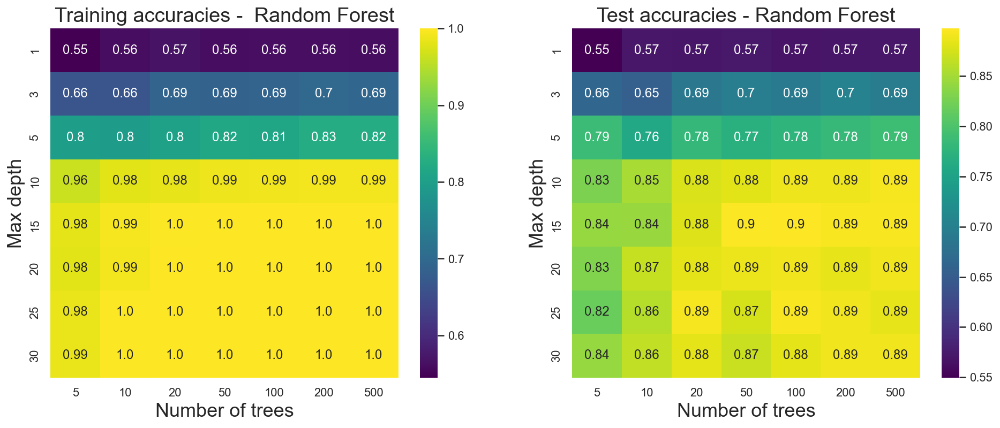

In [25]:
f,(ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16,6))

ax1 = sns.heatmap(TrainAcc, annot=True, ax=ax1, xticklabels = Ntrees, yticklabels=Depth, fmt='.2', cmap='viridis')
ax1.set_title("Training accuracies -  Random Forest", fontsize = 19)
ax1.set_xlabel("Number of trees", fontsize = 18)
ax1.set_ylabel("Max depth", fontsize = 18)


ax2 = sns.heatmap(TestAcc, annot=True, ax=ax2, xticklabels = Ntrees, yticklabels=Depth, fmt='.2', cmap='viridis')
ax2.set_title("Test accuracies - Random Forest", fontsize = 19)
ax2.set_xlabel("Number of trees", fontsize = 18)
ax2.set_ylabel("Max depth", fontsize = 18)
plt.show()

Dalla seguente tabella si possono osservare due comportamenti:
1. Il primo è che per avere delle predizioni sul dataset di test con un'accuratezza maggiore del 80% è necessario prendere delle foreste con un numero sufficientemente grande di alberi e in cui ciascun albero ha una certa profondità.
2. D'altro canto però, le performance non migliorano oltre un certo valore di profondità e oltre un certo numero di alberi all'interno della Random Forest.

Per queste ragioni, per il bisogno di trovare un giusto compromesso, ho deciso di considerare una Random Forest con 100 alberi decisionali, ciascuno con una massima profondità pari a 15 livelli.
Ciascun Decision Tree è stato allenato su una porzione diversa del Dataset, ottenuta tramite 'Bootstrap' dal Dataset originario. L'algoritmo CART per la divisione delle due regioni $R_1$ e $R_2$ in ciascun nodo, seleziona le due regioni in modo da minimizzare la funzione $J=\frac{N^{(1)}}{N_n}Q_1+\frac{N^{(2)}}{N_n}Q_2$, dove $N_n$ è il numero di elementi totali nell'n-esimo nodo, $N^{(1)}$ è il numero di elementi nella prima regione dell'n-esimo nodo, $Q_1$ e $Q_2$ vengono dette *impurità*. I valori di impurità che possono essere passati all'algoritmo sono diversi. Nel mio caso ho usato l'*Indice di Gini* come impurità:

$$
Q_i=I_{G}(i)=1-\sum _{j=1}^{m}P(i,j)^{2}
$$

dove $P(i,j)$ rappresenta la probabilità di ottenere la regione $j$ nell'i-esimo nodo. Di seguito l'implementazione del modello.

In [26]:
RT = RandomForestClassifier(n_estimators=100, bootstrap=True, criterion='gini', max_depth=15, ccp_alpha=0.001)
RT.fit(X_train_forest,Y_train_forest)

y_pred=RT.predict(X_test_forest)

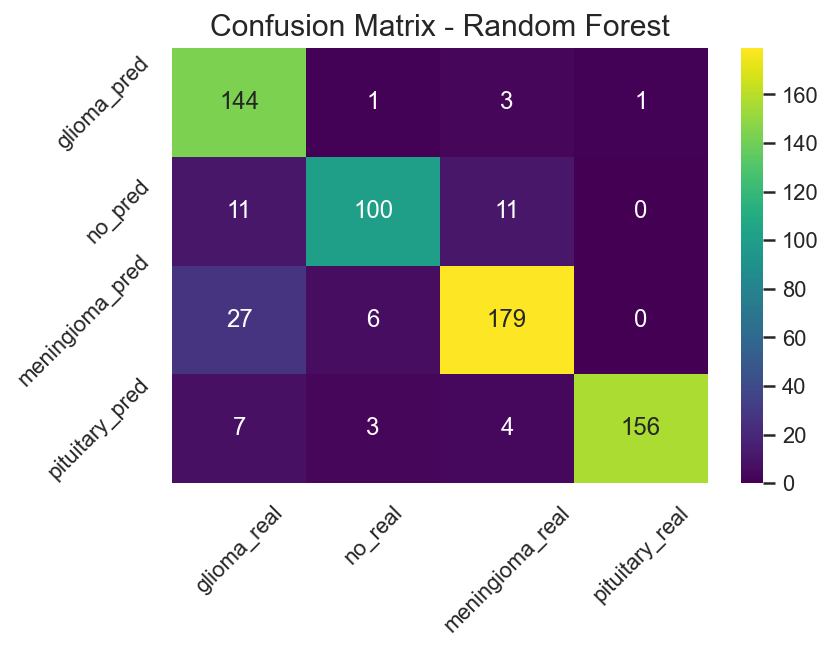

              precision    recall  f1-score   support

           0       0.76      0.97      0.85       149
           1       0.91      0.82      0.86       122
           2       0.91      0.84      0.88       212
           3       0.99      0.92      0.95       170

    accuracy                           0.89       653
   macro avg       0.89      0.89      0.89       653
weighted avg       0.90      0.89      0.89       653



In [27]:
from sklearn import metrics

mat = metrics.confusion_matrix(Y_test_forest, y_pred)
sns.heatmap(mat.T, annot=True,  cmap="viridis", fmt='g')
positions = (0.5, 1.5, 2.5, 3.5)
labels_x = ('glioma_real','no_real','meningioma_real','pituitary_real')
labels_y = ('glioma_pred','no_pred','meningioma_pred','pituitary_pred')
plt.title("Confusion Matrix - Random Forest", fontsize=15)
plt.xticks(positions, labels_x, rotation=45)
plt.yticks(positions, labels_y, rotation=45)
plt.show()

print(metrics.classification_report(y_pred, Y_test_forest))

L'allenamento di questa Random Forest ha permesso di ottenere un modello che raggiunge quasi un'accuratezza del 90% con un tempo di allenamento (tra scelta degli iperparametri e allenamento della Forest) di poco superiore a quello della Convolutional Neural Network.

Ho deciso di stampare anche la matrice i cui elementi rappresentano il numero di volte in cui una data classe delle immagini è stata effettivamente predetta dal modello. Come ci si poteva aspettare dall'accurateza ottenuta, i termini diagonali sono decisamente maggiori di quelli non diagonali per via della bontà della Random Forest. Si può inoltre notare che la maggiore difficoltà del modello è quello di distinguere i tumori del glioma e del meningioma. In effetti osservando le immagini si può verificare come questi due tipologie tumorali siano molto simili tra loro ed entrambe molto differenti dal tumore pituitario.

Di seguito ho riportato una rappresentazione grafica di uno dei cento alberi da cui è comporta la Random Forest definita.

In [28]:
estimator = RT.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = None,
                class_names = True,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.411708 to fit


### <span style="color:darkred">  Conclusioni</span>

In sintesi, ho ottenuto tre diversi modelli per la classificazione di immagini di tumori celebrali. Ho confrontato l'accuratezza dei modelli a parità di tempo di allenamento del predittore. Ho ottenendo i seguenti valori di accuratezza:

1. Accuratezza CNN $\rightarrow$ 89%;  $\text{  }$ tempo di allenamento $\rightarrow$ 4,6 min
2. Accuratezza FFNN $\rightarrow$ 70%;$\text{ }$ tempo di allenamento $\rightarrow$ 4,2 min
3. Accuratezza RF $\rightarrow$ 88%; $\text{        }$ tempo di allenamento $\rightarrow$ 6,1 min

Pertanto, a parità di costo computazionale, la Convolutional Neural Network è il modello in grado di classificare meglio il dataset di partenza. La Random Forest, riesce ad avvicinarsi al livello di accuratezza della CNN, con un costo computazionale leggermente più elevato. 

Ipotizzo che il motivo per cui la CNN risulta essere il miglior modello per la classificazione, sia dato dal fatto che il tumore è effettivamente una componente bidimensionale all'interno dell'immagine: possiede un certo "volume" all'interno di ciascun campionamento. Per questa ragione, un modello che utilizza convoluzioni di pixels appartenenti a una stessa regione, mi aspetto che abbia un'esattezza maggiore di qualunque altro.
